In [3]:
%%html
<link rel="stylesheet" type="text/css" href="rise.css" />

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
plt.style.use('bmh')
plt.rcParams['lines.markeredgecolor'] = 'w'
plt.rcParams['lines.markeredgewidth'] = 0.5
plt.rcParams['figure.figsize'] = [8, 6]

# PCA and clustering with single cell RNAseq gene expression data.
**Learning goals**
- You will appreciate the importance of being able to think critically about your data.
- You will walk thorugh an example for single cell RNAseq data.

Single-cell RNA-seq dataset for mouse tissue.

Download dataset from https://github.com/chanzuckerberg/scRNA-python-workshop/blob/master/content/data.zip

You will need two files in the downloaded `data` folder:
* brain_counts.csv
* brain_metadata.csv

In [5]:
# rows are cells, columns are genes, values reflect the amount of detected RNA
data = pd.read_csv('data/brain_counts.csv', index_col=0)
data

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610008F07Rik,0610009B14Rik,0610009B22Rik,...,Zxdb,Zxdc,Zyg11a,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6,zsGreen_transgene
A1.B003290.3_38_F.1.1,0,125,16,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,54,0
A1.B003728.3_56_F.1.1,0,0,0,0,0,324,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
A1.MAA000560.3_10_M.1.1,0,348,0,0,0,5,0,0,0,0,...,0,0,0,0,0,195,0,0,113,0
A1.MAA000564.3_10_M.1.1,0,41,36,0,0,24,0,0,0,14,...,0,0,0,0,125,0,1,0,0,0
A1.MAA000923.3_9_M.1.1,0,53,0,0,0,0,0,0,0,0,...,0,0,0,81,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P9.MAA000926.3_9_M.1.1,0,111,0,0,32,55,63,0,0,0,...,0,0,0,0,4,12,64,0,3,0
P9.MAA000930.3_8_M.1.1,0,223,2,0,0,49,0,0,0,0,...,0,0,0,10,1,50,2,0,0,0
P9.MAA000932.3_11_M.1.1,0,135,41,0,0,0,0,0,0,0,...,0,19,0,0,18,0,0,0,45,0
P9.MAA000935.3_8_M.1.1,0,129,54,0,0,209,0,0,0,0,...,0,0,0,1,0,0,0,0,57,0


In [6]:
# metadata for each cell
meta = pd.read_csv('data/brain_metadata.csv', index_col=0)
meta

,cell_ontology_class,subtissue,mouse.sex,mouse.id,plate.barcode
cell,,,,,
A1.B003290.3_38_F.1.1,astrocyte,Striatum,F,3_38_F,B003290
A1.B003728.3_56_F.1.1,astrocyte,Striatum,F,3_56_F,B003728
A1.MAA000560.3_10_M.1.1,oligodendrocyte,Cortex,M,3_10_M,MAA000560
A1.MAA000564.3_10_M.1.1,endothelial cell,Striatum,M,3_10_M,MAA000564
A1.MAA000923.3_9_M.1.1,astrocyte,Hippocampus,M,3_9_M,MAA000923
...,...,...,...,...,...
P9.MAA000926.3_9_M.1.1,oligodendrocyte precursor cell,Cortex,M,3_9_M,MAA000926
P9.MAA000930.3_8_M.1.1,astrocyte,Cortex,M,3_8_M,MAA000930
P9.MAA000932.3_11_M.1.1,endothelial cell,Hippocampus,M,3_11_M,MAA000932


In [7]:
data.shape, meta.shape

((3401, 23433), (3401, 5))

In [9]:
meta.subtissue.value_counts()

subtissue
Cortex         1149
Hippocampus     976
Striatum        723
Cerebellum      553
Name: count, dtype: int64

In [10]:
meta.cell_ontology_class.value_counts()

cell_ontology_class
oligodendrocyte                   1574
endothelial cell                   715
astrocyte                          432
neuron                             281
oligodendrocyte precursor cell     203
brain pericyte                     156
Bergmann glial cell                 40
Name: count, dtype: int64

Let's represent each cell by only two weighted mixtures of gene expression profiles.

In [11]:
from sklearn.decomposition import PCA

X = data

pca = PCA(n_components=2)

Xpc = pca.fit_transform(X)

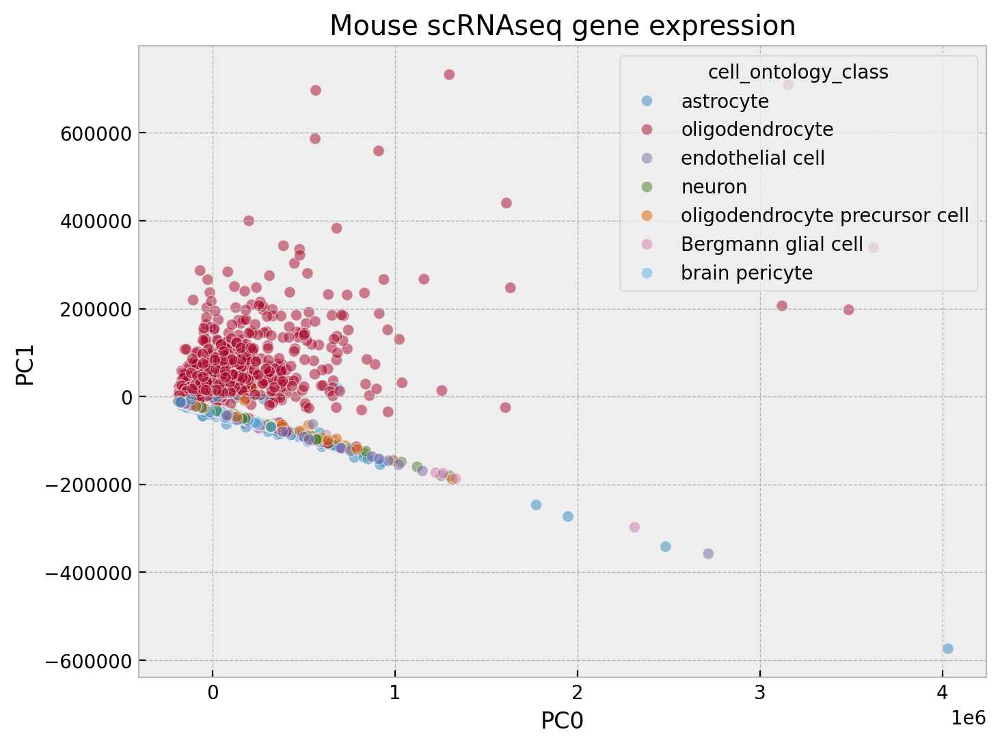

In [12]:
import seaborn as sns

sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=meta.cell_ontology_class)
plt.xlabel('PC0')
plt.ylabel('PC1')
plt.title('Mouse scRNAseq gene expression');

Looks like perhaps we could differentiate oligodendrocytes from other cell types base on their gene expression profiles, but not much else.

Let's take a closer look at the data before we give up.

Total number of counts detected per cell.

In [13]:
data.T.sum()

A1.B003290.3_38_F.1.1       390075
A1.B003728.3_56_F.1.1       776439
A1.MAA000560.3_10_M.1.1    1616087
A1.MAA000564.3_10_M.1.1     360004
A1.MAA000923.3_9_M.1.1      290282
                            ...   
P9.MAA000926.3_9_M.1.1      252305
P9.MAA000930.3_8_M.1.1      424554
P9.MAA000932.3_11_M.1.1     454857
P9.MAA000935.3_8_M.1.1      711797
P9.MAA001894.3_39_F.1.1     130251
Length: 3401, dtype: int64

Total number of genes detected per cell.

In [14]:
(data > 0).T.sum()

A1.B003290.3_38_F.1.1      3359
A1.B003728.3_56_F.1.1      1718
A1.MAA000560.3_10_M.1.1    3910
A1.MAA000564.3_10_M.1.1    4352
A1.MAA000923.3_9_M.1.1     2248
                           ... 
P9.MAA000926.3_9_M.1.1     3982
P9.MAA000930.3_8_M.1.1     5047
P9.MAA000932.3_11_M.1.1    3557
P9.MAA000935.3_8_M.1.1     2920
P9.MAA001894.3_39_F.1.1    1483
Length: 3401, dtype: int64

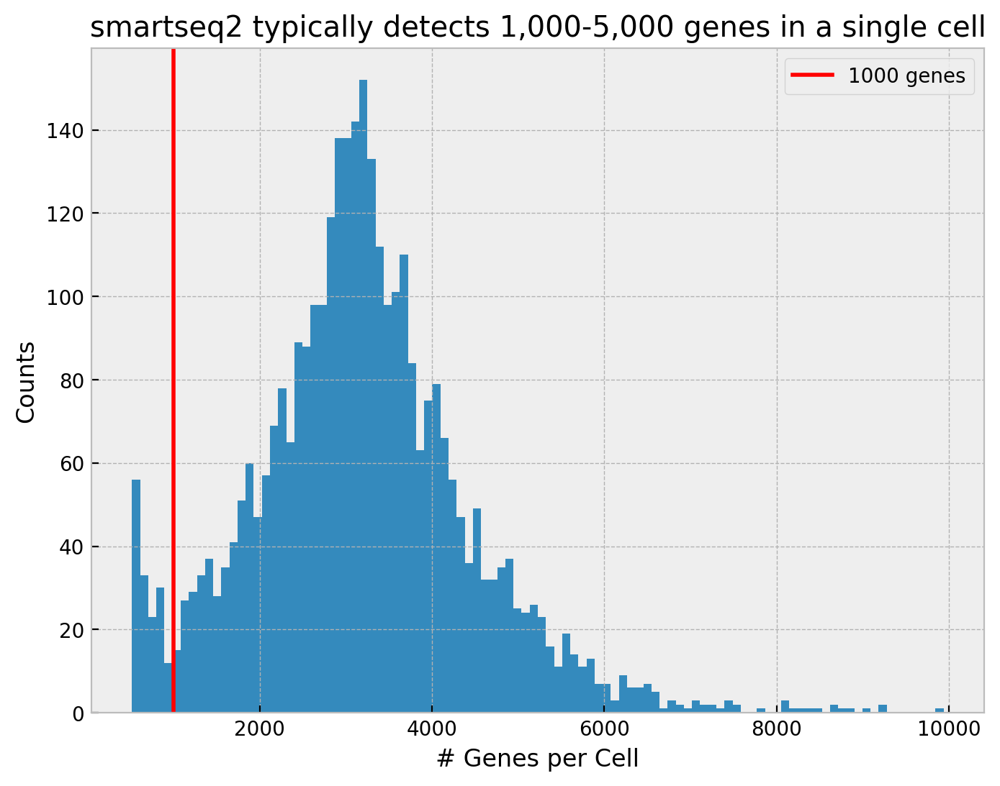

In [15]:
num_genes_per_cell = (data > 0).T.sum()

plt.hist(num_genes_per_cell, 100)
plt.axvline(1000, color='r', label='1000 genes')
plt.xlabel('# Genes per Cell')
plt.ylabel('Counts')
plt.title('smartseq2 typically detects 1,000-5,000 genes in a single cell')
plt.legend();

Remove cells with fewer than 1000 genes detected as these may reflect bad reads.

In [16]:
row_mask = num_genes_per_cell >= 1000
data_ok = data[row_mask]
meta_ok = meta[row_mask]

data.shape, data_ok.shape, meta_ok.shape

((3401, 23433), (3246, 23433), (3246, 5))

A gene is considered detectable if at least two cells contain more than 5 reads from the gene. Remove undetected genes.

In [17]:
is_detected = ((data_ok > 5).sum() >= 2)
is_detected

0610005C13Rik         True
0610007C21Rik         True
0610007L01Rik         True
0610007N19Rik         True
0610007P08Rik         True
                     ...  
Zzef1                 True
Zzz3                  True
a                     True
l7Rn6                 True
zsGreen_transgene    False
Length: 23433, dtype: bool

In [18]:
# before removing undetected genes
data_ok.shape

(3246, 23433)

In [19]:
# remove undetected genes
# (columns with less than two cells with more than five counts)
data_ok = data_ok.T[is_detected].T

# after removing undetected genes
data_ok.shape

(3246, 17689)

normalize counts in each cell to counts per million (CPM)

In [20]:
data_ok = (data_ok.T / data_ok.T.sum() * 1e6).T
data_ok

,0610005C13Rik,0610007C21Rik,0610007L01Rik,0610007N19Rik,0610007P08Rik,0610007P14Rik,0610007P22Rik,0610009B14Rik,0610009B22Rik,0610009D07Rik,...,Zwint,Zxda,Zxdb,Zxdc,Zyg11b,Zyx,Zzef1,Zzz3,a,l7Rn6
A1.B003290.3_38_F.1.1,0.0,320.454481,41.018174,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,138.436336
A1.B003728.3_56_F.1.1,0.0,0.000000,0.000000,0.0,0.000000,417.293465,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
A1.MAA000560.3_10_M.1.1,0.0,215.335475,0.000000,0.0,0.000000,3.093900,0.000000,0.0,0.000000,195.534512,...,164.595507,0.0,0.0,0.000000,0.000000,0.000000,120.662119,0.000000,0.0,69.922151
A1.MAA000564.3_10_M.1.1,0.0,113.888256,99.999444,0.0,0.000000,66.666296,0.000000,0.0,38.888673,0.000000,...,0.000000,0.0,0.0,0.000000,0.000000,347.220293,0.000000,2.777762,0.0,0.000000
A1.MAA000923.3_9_M.1.1,0.0,182.582963,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,279.041887,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P9.MAA000926.3_9_M.1.1,0.0,439.943719,0.000000,0.0,126.830622,217.990131,249.697786,0.0,0.000000,47.561483,...,241.770873,0.0,0.0,0.000000,0.000000,15.853828,47.561483,253.661243,0.0,11.890371
P9.MAA000930.3_8_M.1.1,0.0,525.257093,4.710826,0.0,0.000000,115.415236,0.000000,0.0,0.000000,54.174498,...,167.234321,0.0,0.0,0.000000,23.554130,2.355413,117.770649,4.710826,0.0,0.000000
P9.MAA000932.3_11_M.1.1,0.0,296.797881,90.138616,0.0,0.000000,0.000000,0.000000,0.0,0.000000,59.359576,...,0.000000,0.0,0.0,41.771554,0.000000,39.573051,0.000000,0.000000,0.0,98.932627
P9.MAA000935.3_8_M.1.1,0.0,181.231701,75.864433,0.0,0.000000,293.623454,0.000000,0.0,0.000000,82.888918,...,0.000000,0.0,0.0,0.000000,1.404897,0.000000,0.000000,0.000000,0.0,80.079124


Now that the data has been cleaned up a bit, let's project the 17,689 dimensional gene expression profile of each cell onto two dimensions for simple visualization.

In [25]:
X = data_ok

pca = PCA(2)
pca.fit(X)

PCA(n_components=2)

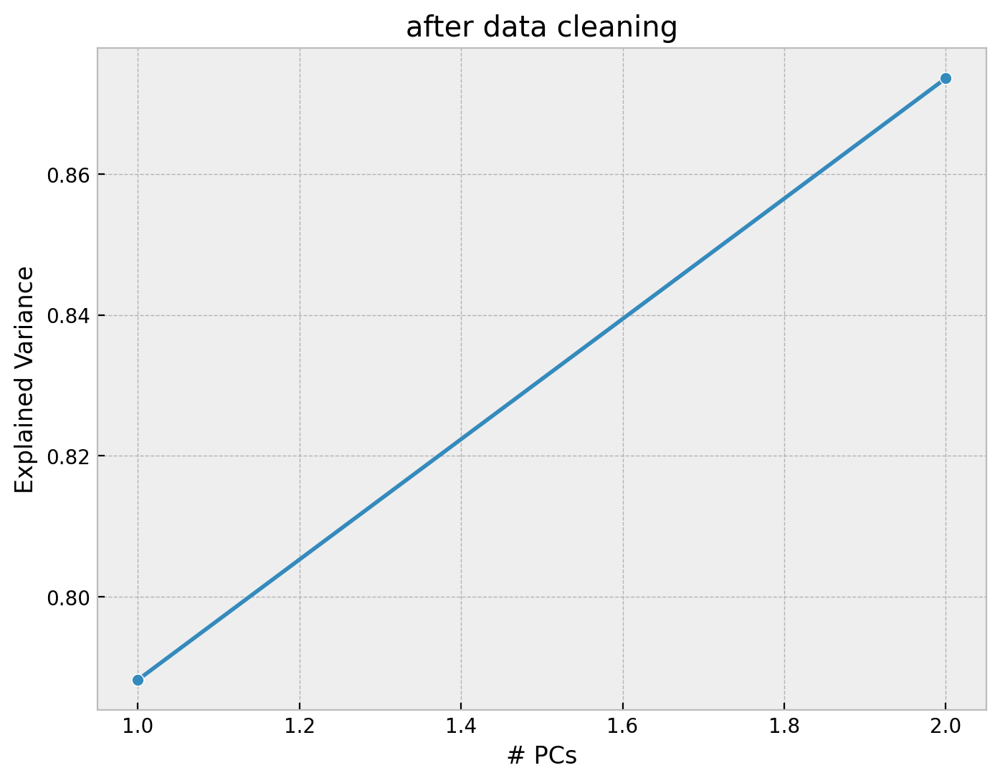

In [26]:
n = np.arange(1, pca.n_components_ + 1)
plt.plot(n, np.cumsum(pca.explained_variance_ratio_), 'o-')
plt.xlabel('# PCs')
plt.ylabel('Explained Variance')
plt.title('after data cleaning');

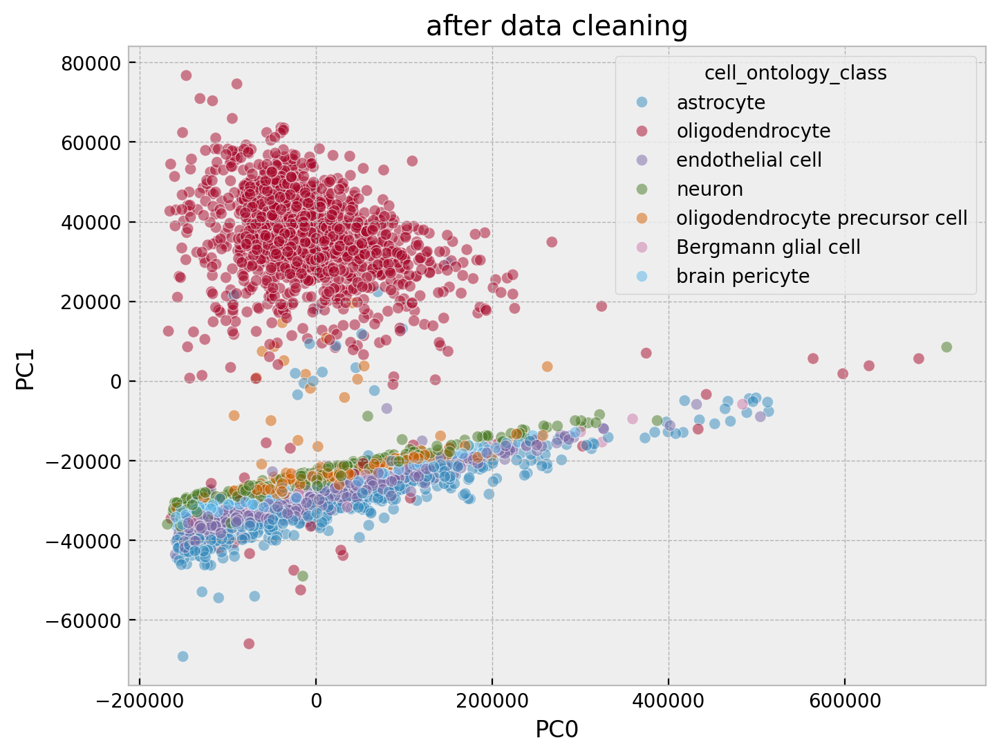

In [27]:
Xpc = pca.transform(X)

sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('PC0')
plt.ylabel('PC1')
plt.title('after data cleaning');

The similar stretched out shape of the clusters for non-oligodendrocytes suggests that their variance along PC0 may be similarly dominated by a few genes.

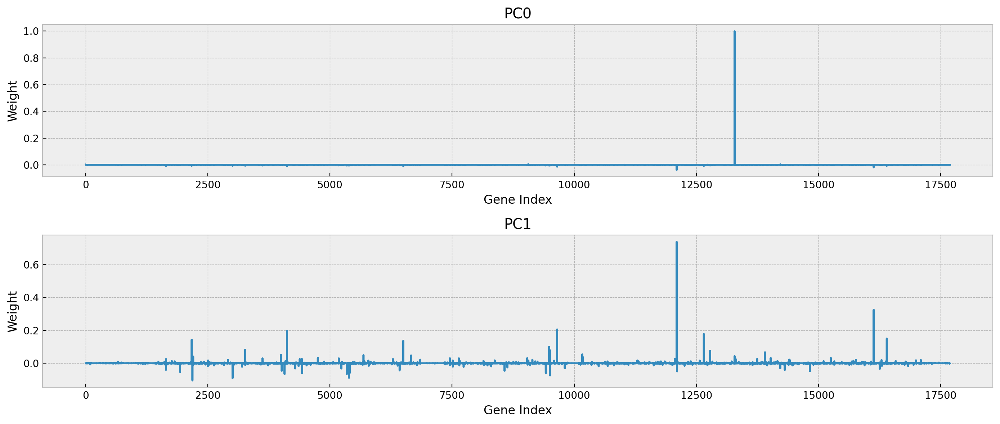

In [28]:
plt.figure(figsize=(14, 6))
x = np.arange(pca.components_.shape[1])
for i in [0, 1]:
    plt.subplot(2,1,i+1)
    plt.plot(x, pca.components_[i], '-')
    # plt.xticks(x, df.columns, rotation='vertical')
    plt.xlabel('Gene Index')
    plt.ylabel('Weight')
    plt.title(f'PC{i}')
plt.tight_layout();

A single gene is dominating PC0.

This may simply be because this gene is highly expressed, in which case PCA will be dominated by it and any other very high expressing genes.

If we want to use PCA to distinguish between variation in the rest of the genes, we can simply remove the highly expressing gene.

In [29]:
ind = np.argmax(pca.components_[0,:])
data_ok.columns[ind]

'Rn45s'

Repeat PCA without Rn45s.

In [30]:
data_ok_no_Rn45s = data_ok.iloc[:,data_ok.columns != "Rn45s"]

data_ok.shape, data_ok_no_Rn45s.shape

((3246, 17689), (3246, 17688))

In [31]:
X = data_ok_no_Rn45s

pca = PCA(2)
pca.fit(X)

PCA(n_components=2)

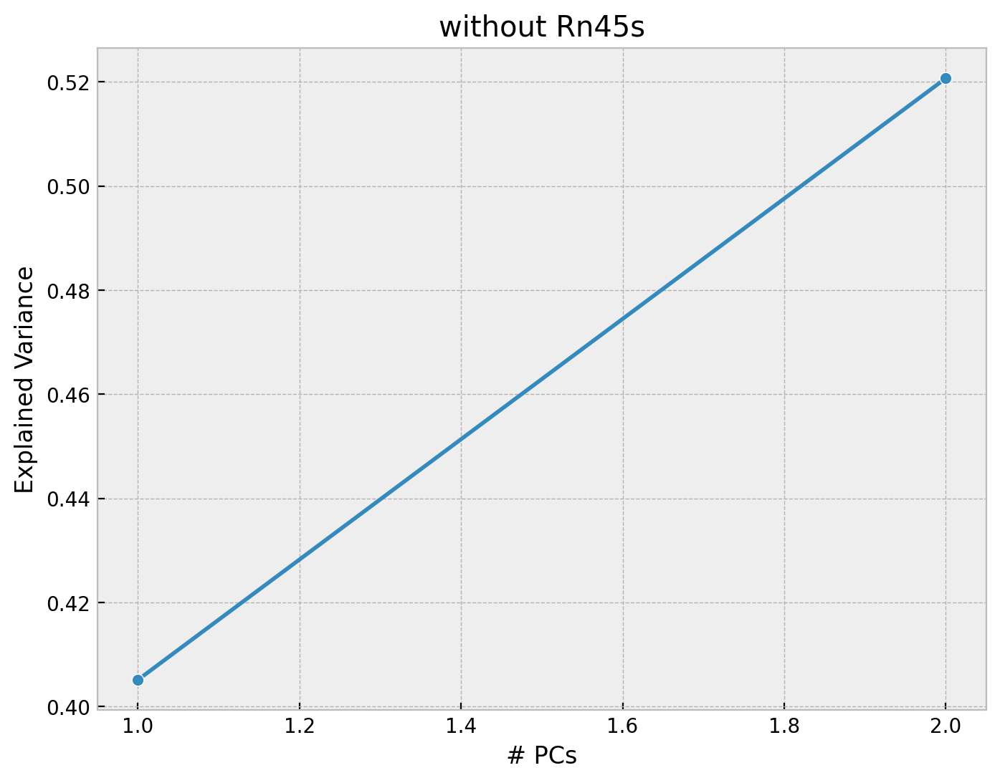

In [32]:
n = np.arange(1, pca.n_components_ + 1)
plt.plot(n, np.cumsum(pca.explained_variance_ratio_), 'o-')
plt.xlabel('# PCs')
plt.ylabel('Explained Variance')
plt.title('without Rn45s');

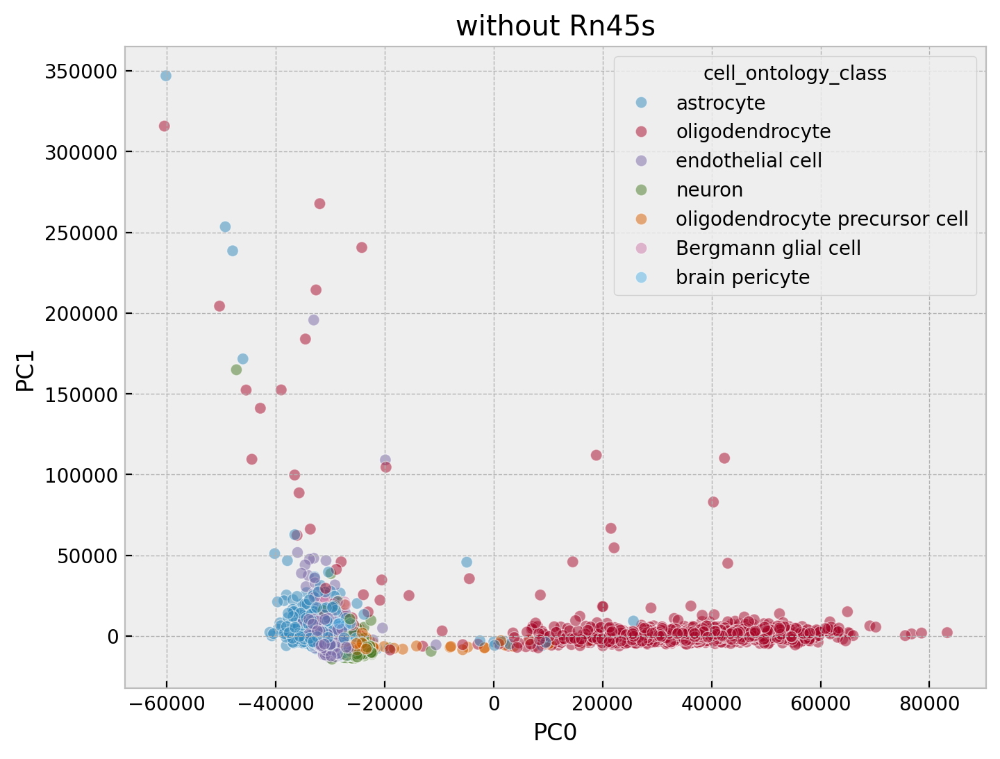

In [33]:
Xpc = pca.transform(X)

sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('PC0')
plt.ylabel('PC1')
plt.title('without Rn45s');

So removing the sinlge very highly expressed gene brought to the fore variations in less highly expressed genes.

But the analysis is still biased towards genes that are more highly expressed.

To remove this bias and focus only on the relative variation in the genes you can standardize the expression columns for each gene (no need to remove Rn45s).

Before standardizing, we also transform the data using a log scaling so that the data for each gene is closer to a Gaussian distribution.

In [34]:
# log scaling makes distributions more similar to a Gaussian
# and +1 maps 0 expr to 0 after log
X = np.log(data_ok.to_numpy() + 1)
Xs = (X - X.mean(axis=0)) / X.std(axis=0)

pca = PCA(2)
pca.fit(Xs)

PCA(n_components=2)

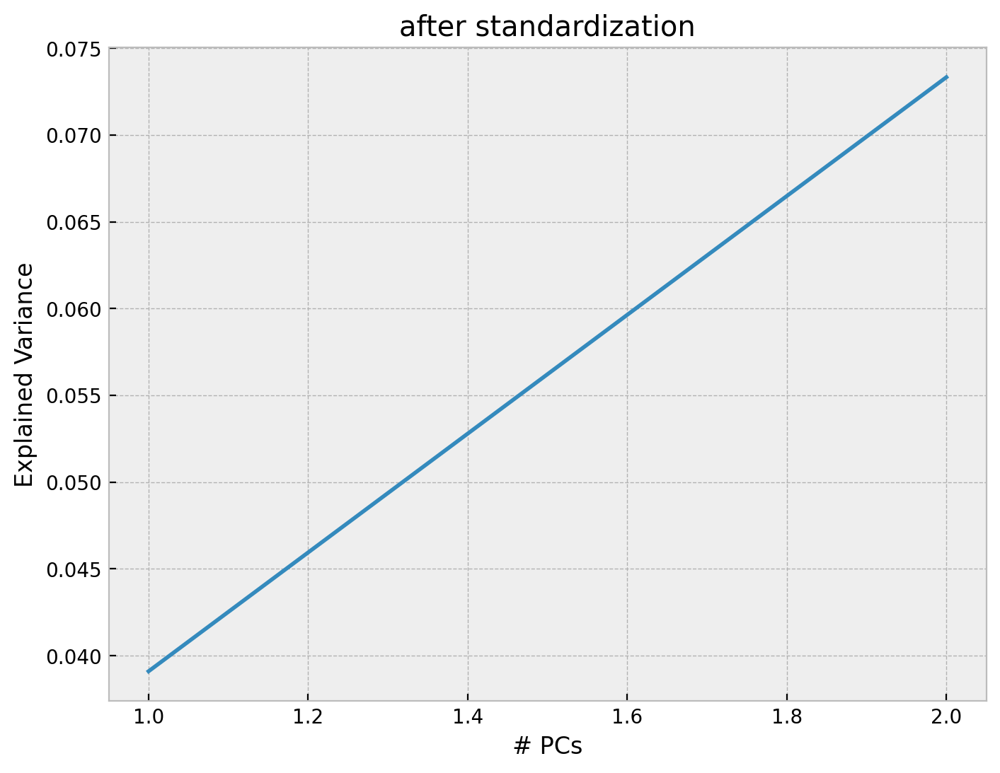

In [35]:
n = np.arange(1, pca.n_components_ + 1)
plt.plot(n, np.cumsum(pca.explained_variance_ratio_), '-')
plt.xlabel('# PCs')
plt.ylabel('Explained Variance')
plt.title('after standardization');

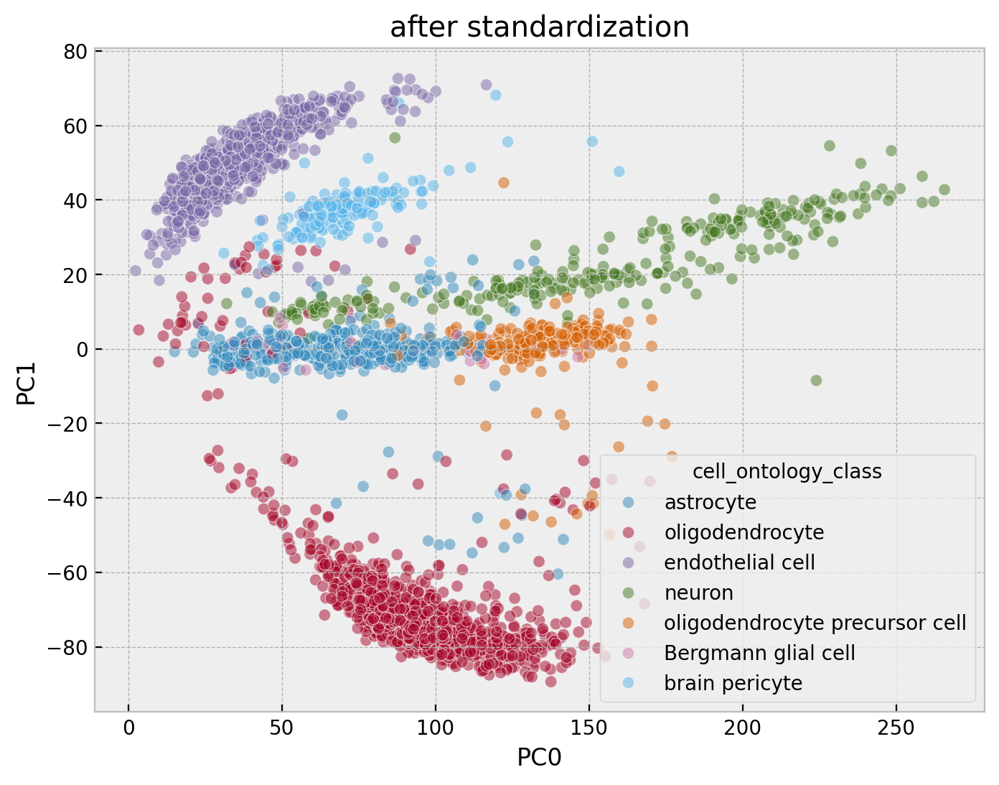

In [36]:
Xpc = pca.transform(X)

sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('PC0')
plt.ylabel('PC1')
plt.title('after standardization');

### Exercise

Assuming you didn't know each cell's type, can you group the cells into clusters that are reasonably associated with their known types? What clustering algorithm might you use? Apply it and see how it does in relation to the known cell types.

In [ ]:
# 1. create your clustering model...

# 2. cluster the PCA-projected data Xpc...

# 3. plot the PCA-projected data colored by cluster label...


### Exercise key

Assuming you didn't know each cell's type, can you group the cells into clusters that are reasonably associated with their known types? What clustering algorithm might you use? Apply it and see how it does in relation to the known cell types.

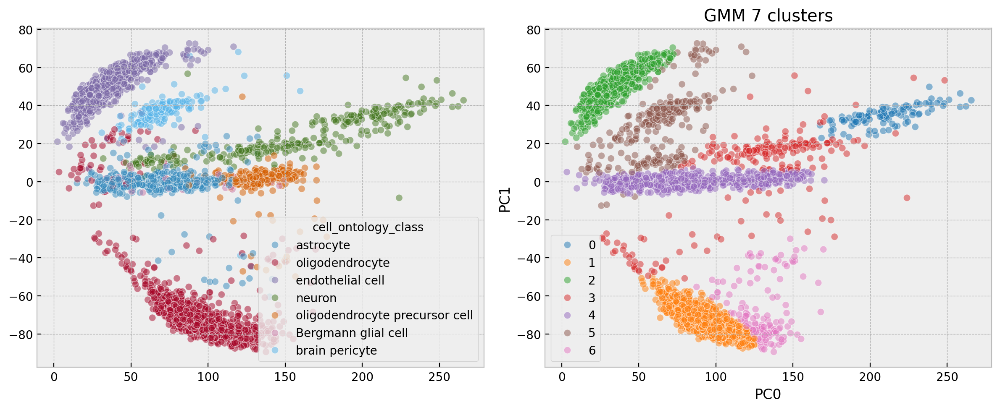

In [83]:
# 1. create your clustering model...
from sklearn.mixture import GaussianMixture

# 7 clusters for 7 cell types
gmm = GaussianMixture(n_components=7, random_state=0)

# 2. cluster the PCA-projected data Xpc...
labels = gmm.fit_predict(Xpc)

# 3. plot the PCA-projected data colored by cluster label...
fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class, ax=ax[0])
plt.xlabel('PC0')
plt.ylabel('PC1')
plt.title('known cell types')
sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=labels, ax=ax[1], palette='tab10')
plt.xlabel('PC0')
plt.ylabel('PC1')
plt.title(f'GMM {gmm.n_components} clusters')
plt.tight_layout();

### Exercise
What if we didn't know how many cell types there were?

Use Bayesian Information Criterion (BIC) to determine the optimal number of clusters for a Gaussian Mixture Model (GMM). Then plot the PCA-projected cells colored by cluster.

In [ ]:
# from sklearn.mixture import GaussianMixture

# # rank various numbers of clusters with BIC
# n_clusters = np.arange(2, 21)
# scores = []
# ...

# # plot the BIC scores vs number of clusters
# plt.plot(n_clusters, scores, 'o-')
# plt.xticks(n_clusters)
# plt.xlabel('# Clusters');
# plt.ylabel('Bayesian Information Criteria (BIC)')
# plt.title('Minimum BIC score is best');

In [ ]:
# # cluster with a GMM for the selected number of clusters
# n = ...
# gmm = ...
# labels = ...

# # plot the PCA-projected cells colored by either known cell type or cluster label
# fig, ax = plt.subplots(1, 2, figsize=[12,5])
# sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class, ax=ax[0])
# plt.xlabel('PC0')
# plt.ylabel('PC1')
# plt.title('known cell types')
# sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=labels, ax=ax[1], palette='tab10')
# plt.xlabel('PC0')
# plt.ylabel('PC1')
# plt.title(f'GMM {n} clusters')
# plt.tight_layout();

### Exercise key
What if we didn't know how many cell types there were?

Use Bayesian Information Criterion (BIC) to determine the optimal number of clusters for a Gaussian Mixture Model (GMM). Then plot the PCA-projected cells colored by cluster.

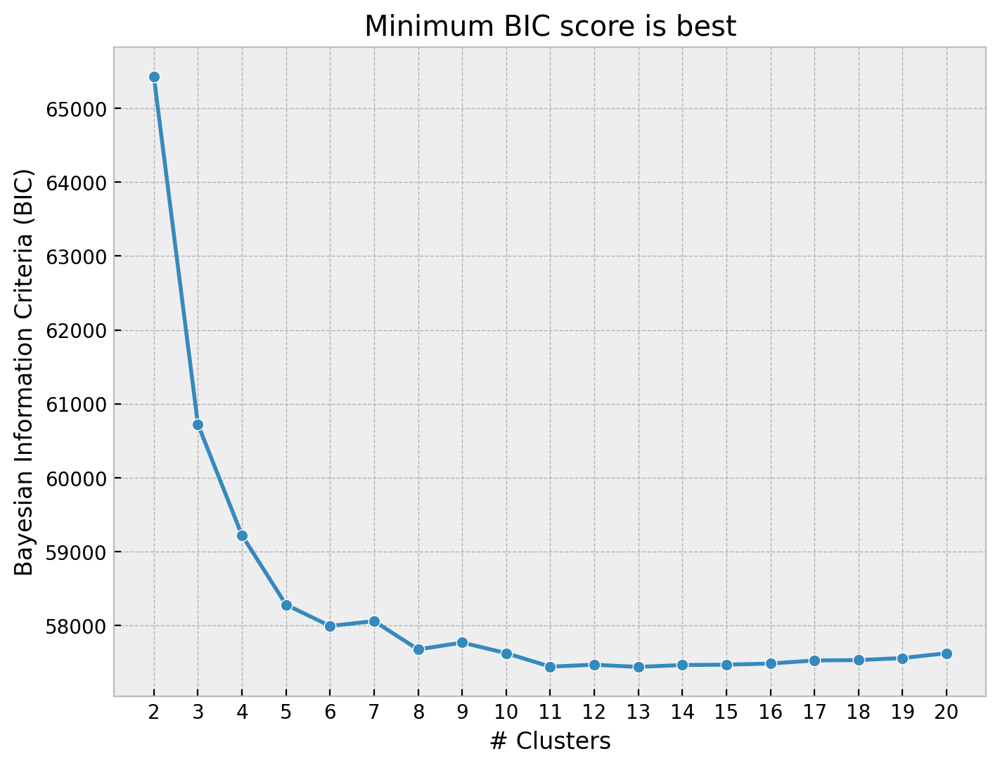

In [71]:
from sklearn.mixture import GaussianMixture

# rank various numbers of clusters with BIC
n_clusters = np.arange(2, 21)
scores = []
for n in n_clusters:
    gmm = GaussianMixture(n_components=n, random_state=0)
    labels = gmm.fit_predict(Xpc)
    score = gmm.bic(Xpc)
    scores.append(score)

# plot the BIC scores vs number of clusters
plt.plot(n_clusters, scores, 'o-')
plt.xticks(n_clusters)
plt.xlabel('# Clusters');
plt.ylabel('Bayesian Information Criteria (BIC)')
plt.title('Minimum BIC score is best');

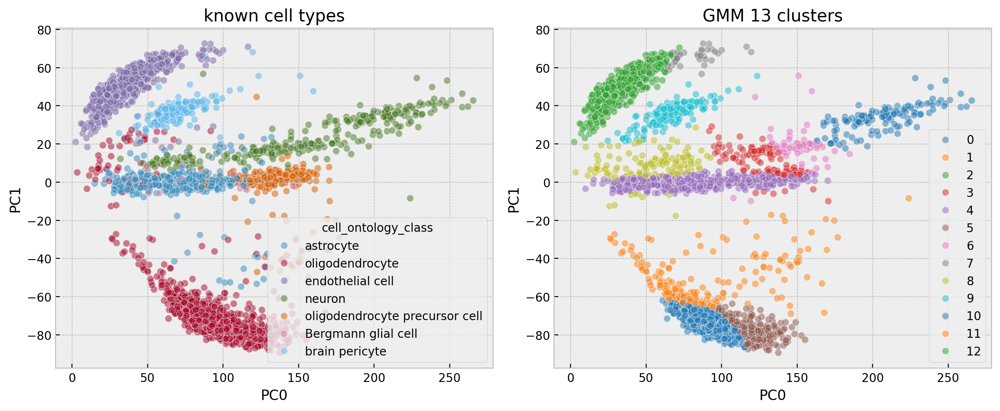

In [72]:
# cluster with a GMM for the selected number of clusters
n = n_clusters[np.argmin(scores)]
gmm = GaussianMixture(n_components=n, random_state=0)
labels = gmm.fit_predict(Xpc)

# plot the PCA-projected cells colored by either known cell type or cluster label
fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class, ax=ax[0])
ax[0].set_xlabel('PC0')
ax[0].set_ylabel('PC1')
ax[0].set_title('known cell types')
sns.scatterplot(x=Xpc[:,0], y=Xpc[:,1], alpha=0.5, hue=labels, ax=ax[1], palette='tab10')
ax[1].set_xlabel('PC0')
ax[1].set_ylabel('PC1')
ax[1].set_title(f'GMM {n} clusters')
plt.tight_layout();

### t-SNE (t-Distributed Stochastic Neighbor Embedding)

In [51]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=0)

Xtsne = tsne.fit_transform(Xs)

Xs.shape, Xtsne.shape

((3246, 17689), (3246, 2))

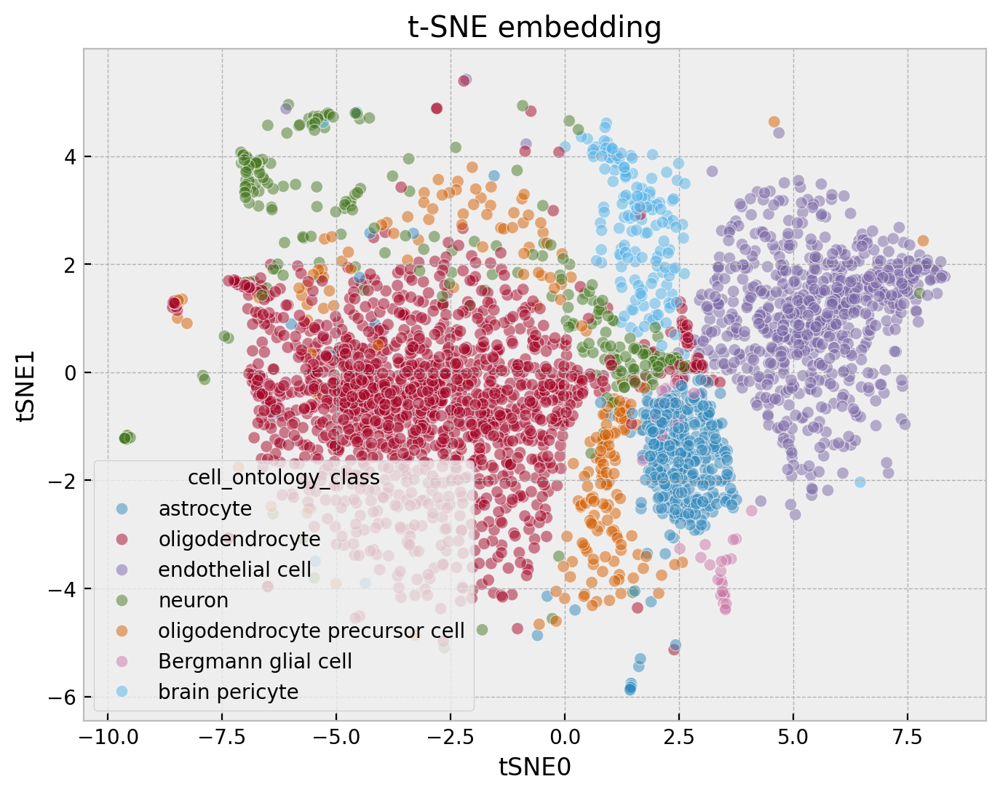

In [52]:
sns.scatterplot(x=Xtsne[:,0], y=Xtsne[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('tSNE0')
plt.ylabel('tSNE1')
plt.title('t-SNE embedding');

There are several optional parameters for TSNE. One is the `learning_rate`.

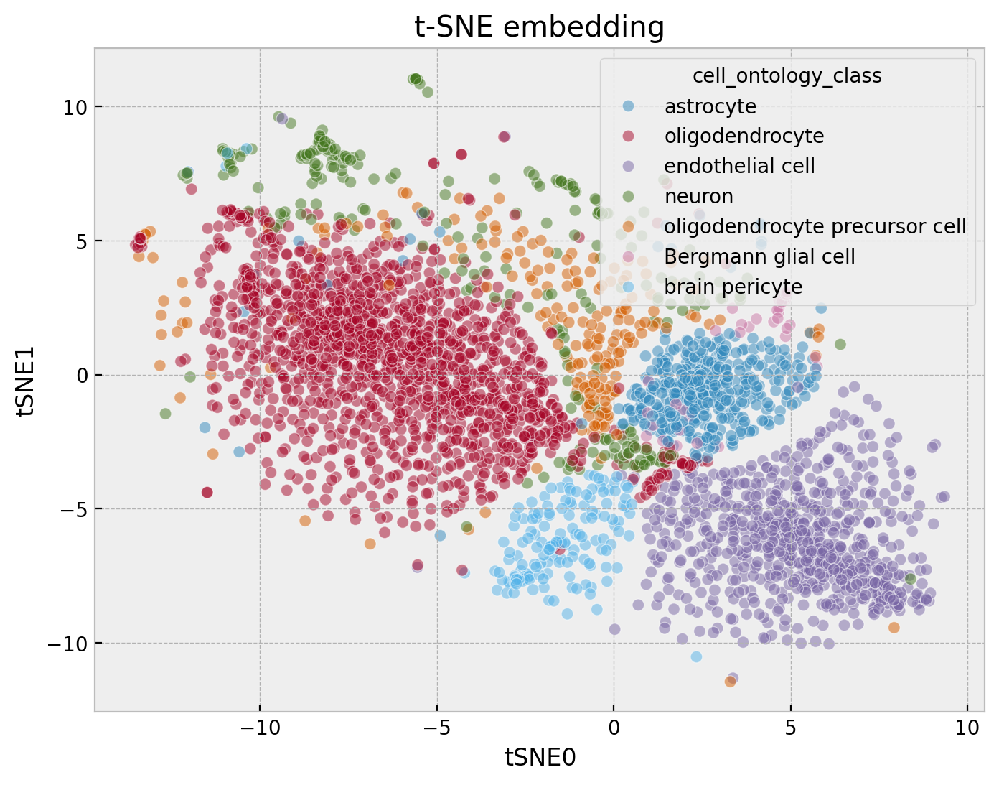

In [53]:
tsne = TSNE(n_components=2, learning_rate=800, random_state=0)

Xtsne = tsne.fit_transform(Xs)

sns.scatterplot(x=Xtsne[:,0], y=Xtsne[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('tSNE0')
plt.ylabel('tSNE1')
plt.title('t-SNE embedding');

Search for an optimal learning rate.

In [55]:
from sklearn.metrics import silhouette_score

learning_rates = np.linspace(10, 1000, 10)
scores = []
for lr in learning_rates:
    tsne = TSNE(n_components=2, learning_rate=lr, random_state=0)
    Xtsne = tsne.fit_transform(Xs)
    score = silhouette_score(Xtsne, meta_ok.cell_ontology_class)
    scores.append(score)

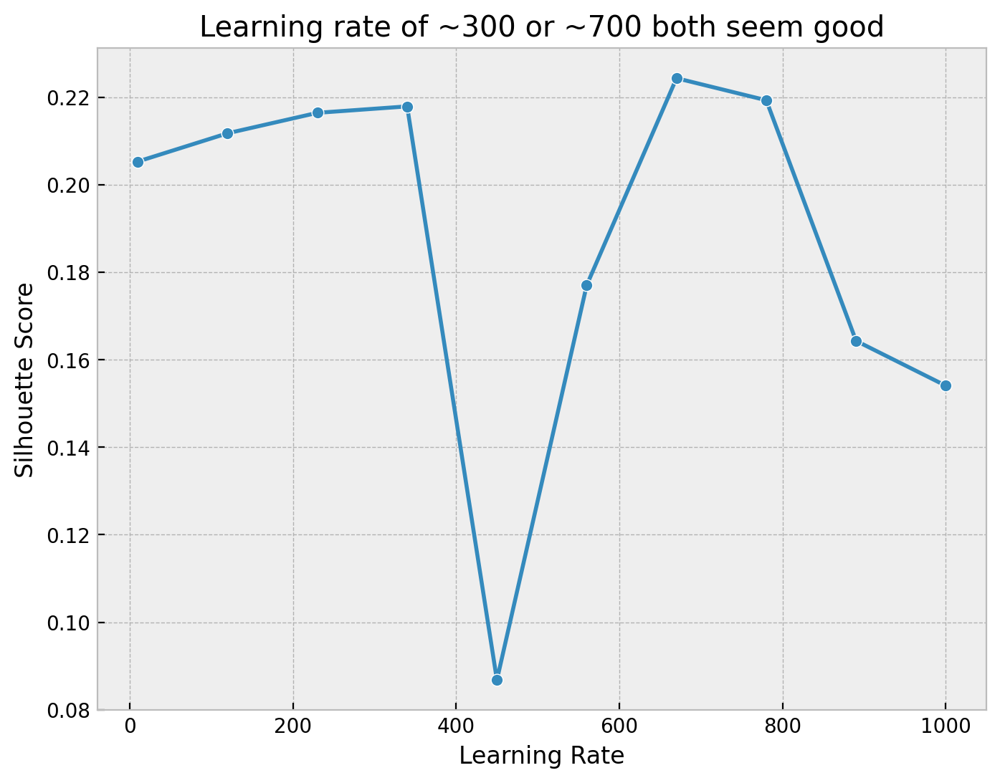

In [65]:
plt.plot(learning_rates, scores, 'o-')
plt.xlabel('Learning Rate')
plt.ylabel('Silhouette Score')
plt.title(r'Learning rate of ~300 or ~700 both seem good');

In [57]:
learning_rate = learning_rates[np.argmax(scores)]
learning_rate

670.0

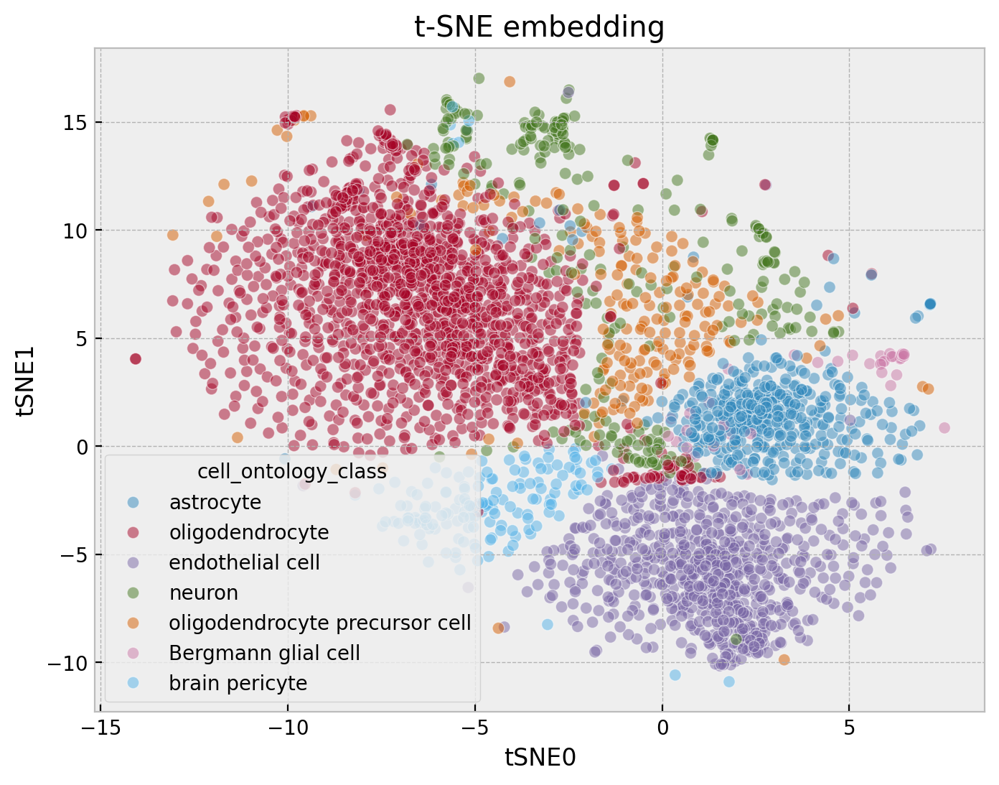

In [58]:
tsne = TSNE(n_components=2, learning_rate=learning_rate, random_state=0)
Xtsne = tsne.fit_transform(Xs)

sns.scatterplot(x=Xtsne[:,0], y=Xtsne[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('tSNE0')
plt.ylabel('tSNE1')
plt.title('t-SNE embedding');

Check out https://distill.pub/2016/misread-tsne/ for a discussion of t-SNE hyperparameters.

### UMAP (Uniform Approximation and Projection)

`pip install umap-learn`

In [60]:
from umap import UMAP

# Hhere are a bunch of parameters you can tweak in UMAP,
# but I'll let you look those up on your own.
# Here we just use all the defaults.
umap = UMAP()

umap.fit(Xs)
Xumap = umap.transform(Xs)

Xs.shape, Xumap.shape

((3246, 17689), (3246, 2))

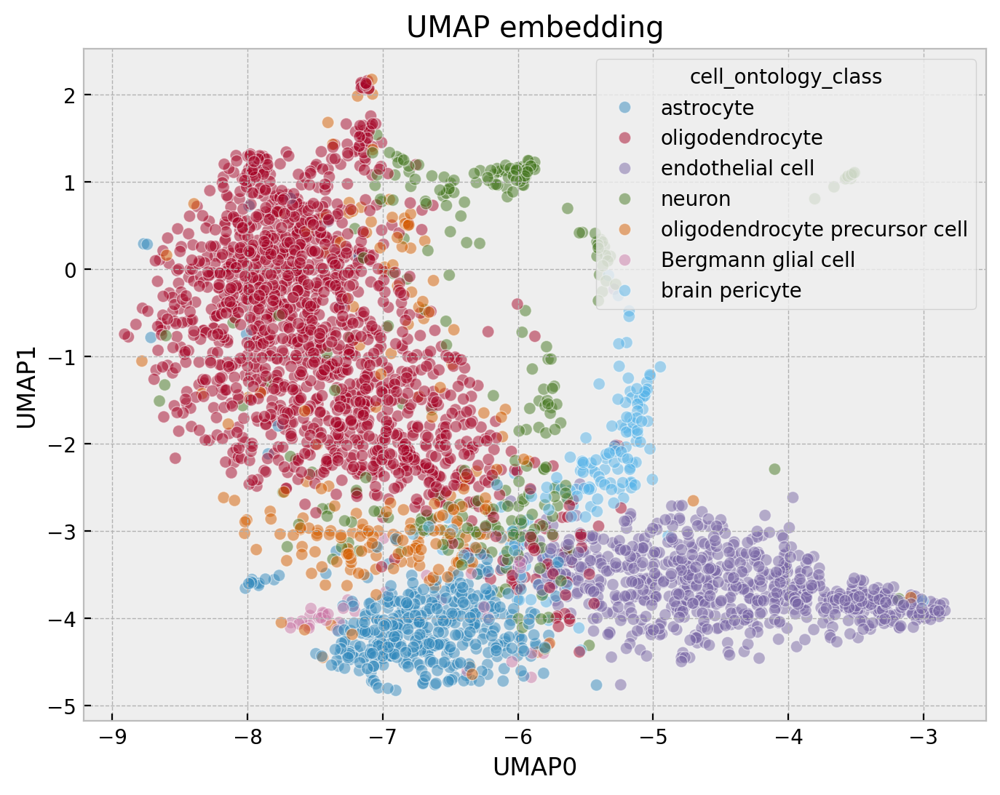

In [61]:
sns.scatterplot(x=Xumap[:,0], y=Xumap[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('UMAP0')
plt.ylabel('UMAP1')
plt.title('UMAP embedding');

### LDA (Linear Discriminant Analysis)

This is a classifier that also projects the data onto a lower dimensional space.

In [76]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

lda = LDA(n_components=2)

Xlda = lda.fit_transform(Xs, meta_ok.cell_ontology_class)

Xs.shape, Xlda.shape

((3246, 17689), (3246, 2))

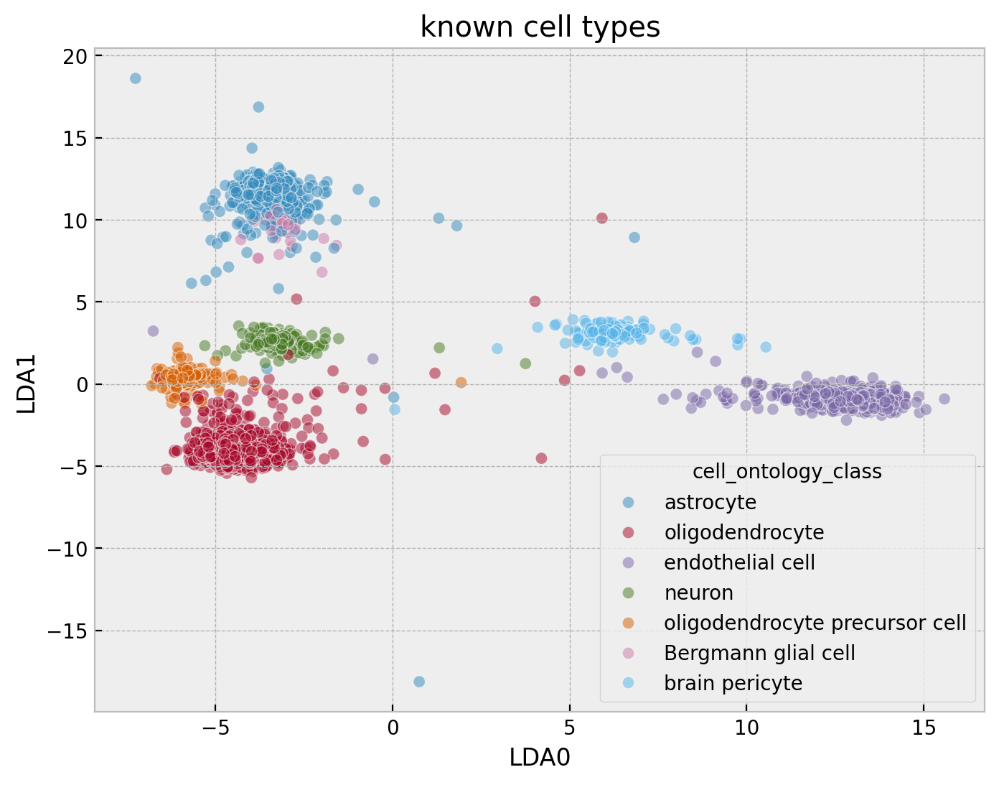

In [77]:
sns.scatterplot(x=Xlda[:,0], y=Xlda[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class)
plt.xlabel('LDA0')
plt.ylabel('LDA1')
plt.title('known cell types');

In [84]:
predicted_cell_types = lda.predict(Xs)
predicted_cell_types

array(['astrocyte', 'astrocyte', 'oligodendrocyte', ...,
       'endothelial cell', 'oligodendrocyte', 'astrocyte'], dtype='<U30')

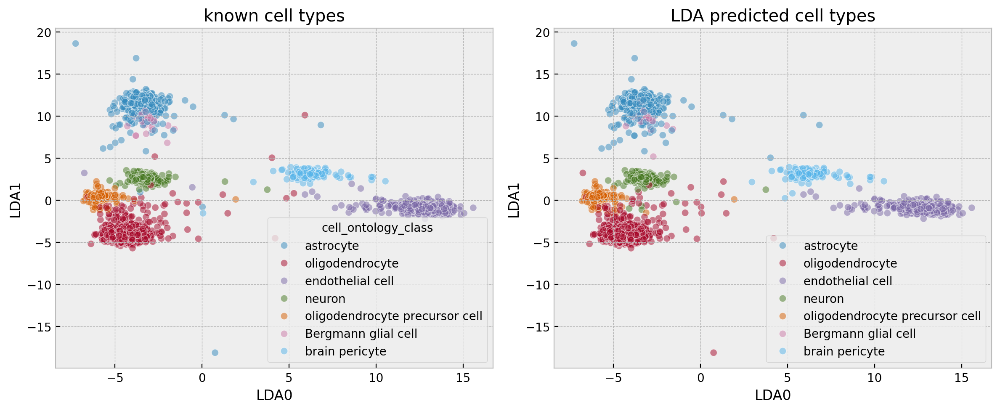

In [85]:
fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(x=Xlda[:,0], y=Xlda[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class, ax=ax[0])
ax[0].set_xlabel('LDA0')
ax[0].set_ylabel('LDA1')
ax[0].set_title('known cell types')
sns.scatterplot(x=Xlda[:,0], y=Xlda[:,1], alpha=0.5, hue=predicted_cell_types, ax=ax[1])
ax[1].set_xlabel('LDA0')
ax[1].set_ylabel('LDA1')
ax[1].set_title('LDA predicted cell types')
plt.tight_layout();

But we really should be using cross validated predictions (or predictions for a withheld test set that was not used to train the model)!

Otherwise, we are overestimating how sell the classifier will do when given new data it was not trained on.

In [80]:
from sklearn.model_selection import cross_val_predict

predicted_cell_types = cross_val_predict(lda, Xs, meta_ok.cell_ontology_class, cv=3)

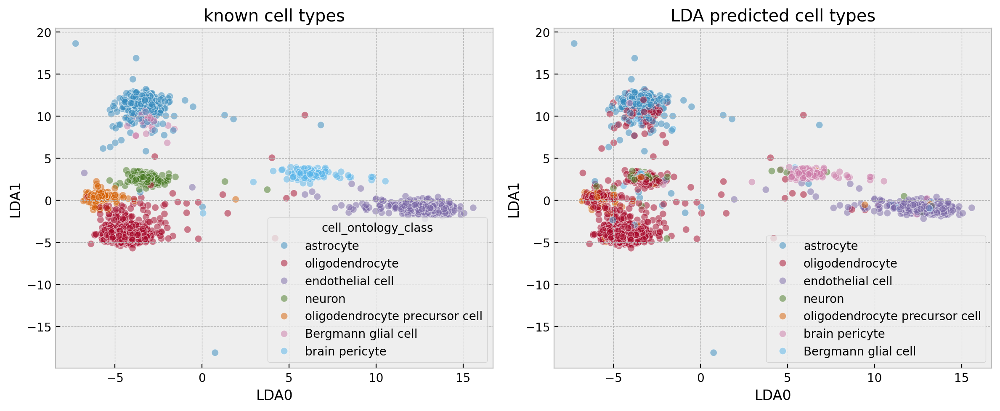

In [81]:
fig, ax = plt.subplots(1, 2, figsize=[12,5])
sns.scatterplot(x=Xlda[:,0], y=Xlda[:,1], alpha=0.5, hue=meta_ok.cell_ontology_class, ax=ax[0])
ax[0].set_xlabel('LDA0')
ax[0].set_ylabel('LDA1')
ax[0].set_title('known cell types')
sns.scatterplot(x=Xlda[:,0], y=Xlda[:,1], alpha=0.5, hue=predicted_cell_types, ax=ax[1])
ax[1].set_xlabel('LDA0')
ax[1].set_ylabel('LDA1')
ax[1].set_title('LDA predicted cell types')
plt.tight_layout();